<h1>Discretization of the Langevin dynamics and its Metropolization</h1>

<a id='langevin'></a>
<h2>The Langevin dynamics</h2>

It is a phenomenological model of a Hamiltonian system coupled with a thermostat (infinite reservoir of energy). The thermostat models the heat exchanges between the system and its environment (<i>e.g.</i> through collisions).

We denote by $d$ the dimension, and $N$ the number of particles composing the system at hand (we will consider $d=2$ and $N=1$ in our numerical examples). The corresponding stochastic equations of motion read
$$
\left\lbrace
\begin{aligned}
{\rm d}q_t &= \nabla_p H(q_t,p_t)\,{\rm d}t,\\
{\rm d}p_t &= -\nabla_q H(q_t,p_t)\,{\rm d}t-\gamma(q_t)\nabla_p H(q_t,p_t)\,{\rm d}t+\sigma(q_t)\,{\rm d}W_t,
\end{aligned}
\right.
$$
where:
* $(q_t,p_t)\in\mathbb{R}^{dN\times dN}$ denotes the state of the system at time $t$, $q_t$ being the positions of the particles and $p_t$ their momenta;
* $t\mapsto W_t$ is a $dN$-dimensional standard Brownian motion;
* $H$ is the Hamiltonian of the system:
$$
H(q,p)=V(q)+\frac{1}{2}p^{\mathsf{T}}M^{-1}p,
$$
with $M={\rm diag}([m_i]_d)_{1\leqslant i\leqslant N}\in\mathcal{M}_{dN}(\mathbb{R})$ the mass matrix ($m_i$ is the mass of the $i$-th particle, appearing $d$ times in a row in the diagonal of $M$) and $V:\mathbb{R}^{dN}\to\mathbb{R}$ is a (smooth) potential energy function;
* $\sigma:\mathbb{R}^{dN}\to\mathcal{M}_{dN}(\mathbb{R})$ and $\gamma:\mathbb{R}^{dN}\to\mathcal{M}_{dN}(\mathbb{R})$ output real matrices. We will consider only isotropic outputs and consider $\gamma,\sigma$ to be (positive) scalars. The term $\sigma{\rm d}W_t$ is a fluctuation term bringing energy into the system, while this energy is being dissipated by the viscous friction term $-\gamma\nabla_p H(q_t,p_t)\,{\rm d}t=-\gamma M^{-1}p_t\,{\rm d}t$. These two terms are related through the <i>fluctuation-dissipation</i> relation:
$$
\sigma\sigma^{\mathsf{T}}=\frac{2\gamma}{\beta}.
$$
Under standard assumptions, the process $(q_t,p_t)_{t\geqslant0}$ admits a unique equilibrium distribution, which is the Boltzmann-Gibbs probability distribution:
$$
\mu({\rm d}q\,{\rm d}p)=Z_\mu^{-1}{\rm e}^{-\beta H(q,p)}{\rm d}q\,{\rm d}p,\qquad Z_\mu=\int_{\mathbb{R}^{dN}\times\mathbb{R}^{dN}}{\rm e}^{-\beta H(q,p)}{\rm d}q\,{\rm d}p.
$$

We therefore consider the following stochastic differential equations:
$$
\tag{Langevin}
\left\lbrace
\begin{aligned}
{\rm d}q_t &= \textcolor{blue}{M^{-1}p_t\,{\rm d}t},\\
{\rm d}p_t &= \textcolor{blue}{-\nabla V(q_t)\,{\rm d}t}\textcolor{red}{-\gamma M^{-1}p_t\,{\rm d}t+\sqrt{\frac{2\gamma}{\beta}}{\rm d}W_t},
\end{aligned}
\right.
$$
The $\textcolor{blue}{\rm blue}$ part are the Hamilton's equations of motion, the $\textcolor{red}{\rm red}$ part is an Ornstein-Uhlenbeck process. A possible numerical integration of this process is based on a splitting strategy, considering separately a consistent discretization of the Ornstein-Uhlenbeck process (exact solution, Euler schemes) and a numerical integration of the Hamiltonian dynamics (Störmer-Verlet/leapfrog integrator).

<h2>Numerical implementation</h2>

We note by $\Delta t>0$ the time step used to integrate the dynamics.

<h3>Hamilton's equations</h3>

Hamiltonian dynamics are commonly numerically integrating using the Störmer-Verlet algorithm, which is a composition of the symplectic Euler A and B schemes. Given a configuration $(q^0,p^0)$ the symplectic Euler A scheme reads
$$
\tag{Euler A}
\left\lbrace
\begin{aligned}
q^1 &= q^0 + \Delta t M^{-1}p^0,\\
p^1 &= p^0 - \Delta t\nabla V(q^1),
\end{aligned}
\right.
$$
while the symplectic Euler B scheme reads
$$
\tag{Euler B}
\left\lbrace
\begin{aligned}
q^1 &= q^0 + \Delta t M^{-1}p^1,\\
p^1 &= p^0 - \Delta t\nabla V(q^0).
\end{aligned}
\right.
$$
The (velocity) Verlet integrator is a composition of half-steps of Euler B and Euler A, and therefore reads
$$
\tag{Störmer--Verlet}
(q^1,p^1)=\varphi_{\Delta t}^{\rm SV}(q^0,p^0),\qquad
\left\lbrace
\begin{aligned}
p^{1/2} &= p^0-\frac{\Delta t}{2}\nabla V(q^0)\\
q^1 &= q^0 +\Delta t M^{-1}p^{1/2},\\
p^1 &= p^{1/2}-\frac{\Delta t}{2}\nabla V(q^1).
\end{aligned}
\right.
$$

Often, a A step corresponds to only updating the positions (and keeping the momenta fixed), while a B step corresponds to only updating the momenta (with the positions fixed). We shall use this notation later when naming numerical integrators based on splitting strategies:
$$
\begin{align}
\tag{A}
(q^1,p^1)&=\varphi_{\Delta t}^{\rm A}(q^0,p^0)=(q^0+\Delta t M^{-1}p^0, p^0),\\
\tag{B}
(q^1,p^1)&=\varphi_{\Delta t}^{\rm B}(q^0,p^0)=(q^0, p^0-\Delta t\nabla V(q^0)).
\end{align}
$$
We therefore write
$$
\varphi_{\Delta t}^{\rm SV}=\varphi_{\Delta t/2}^{\rm B}\circ\varphi_{\Delta t}^{\rm A}\circ\varphi_{\Delta t/2}^{\rm B}.
$$

<a id='ou_process'></a>
<h3>Ornstein-Uhlenbeck process</h3>

The analytical solution of the Ornstein-Uhlenbeck process is known: if $p_0$ is the inital momenta at time $t=0$, then
$$
p_t = {\rm e}^{-\gamma M^{-1}t}p_0 + \sqrt{\frac{2\gamma}{\beta}}\int_{0}^t {\rm e}^{-\gamma M^{-1}(t-s)}{\rm d}W_s.
$$
This is a Gaussian process with mean ${\rm e}^{-\gamma M^{-1}t}p_0$ and covariance matrix
$$
\frac{2\gamma}{\beta}\int_{0}^t {\rm e}^{-2\gamma M^{-1}(t-s)}ds=\frac{1}{\beta}({\rm I}_{dN}-{\rm e}^{-2\gamma M^{-1}t})M.
$$
Therefore, a consistent discretization of the Ornstein-Uhlenbeck process over the time interval $[0,\Delta t]$ is
$$
\tag{O}
p^1 = {\rm e}^{-\gamma M^{-1}\Delta t}p^0 + \sqrt{\frac{\left({\rm I}_{dN}-{\rm e}^{-2\gamma M^{-1}\Delta t}\right)M}{\beta}}{\rm G}^1,\qquad {\rm G}^1\sim\mathcal{N}(0,{\rm I}_{dN}).
$$
We shall also note this update with $\varphi_{\Delta t}^{\rm O}(q^0,p^0)=(q^0,p^1)$ with $p^1$ defined above (even though this is not a numerical flow since noise is introduced).

<h3>A splitting strategy</h3>

A common choice to integrate the Langevin dynamics is the BAOAB integrator: as hinted by the letters, it performs a half B step, a half A step, a full O step, and then again a half A step and half B step:
$$
\varphi_{\Delta t}^{\rm BAOAB}=\varphi_{\Delta t/2}^{\rm B}\circ\varphi_{\Delta t/2}^{\rm A}\circ\varphi_{\Delta t}^{\rm O}\circ\varphi_{\Delta t/2}^{\rm A}\circ\varphi_{\Delta t/2}^{\rm B}.
$$

<b><u>Question.</u> How many forces computations (call to the function $\nabla V$) are needed per step for the BAOAB integrator ?</b>

<h2>A 2D toy example</h2>

We consider a system composed of $N=1$ particle of mass 1 in dimension $d=2$, under the influence of a potential energy function $V$ which writes
$$
\tag{Entropic switch}
V(x,y)=3{\rm e}^{-x^2}({\rm e}^{-(y-1/3)^2}-{\rm e}^{-(y-5/3)^2})-5{\rm e}^{-y^2}({\rm e}^{-(x-1)^2}+{\rm e}^{-(x+1)^2})+0.2x^4+0.2(y-1/3)^4.
$$
The potential energy function $V$ has two deep wells centered at $q_{\rm L}=(-1.048, -0.04210),q_{\rm R}=(1.048, -0.04210)$, and a shallow well around $q_{\rm S}=(0., 1.5371)$.

<i>Julia particularities</i>
* ```...``` is the "splat" operator, which unpacks an Array, equivalent to ```*``` in Python for example. It is used here to apply a function to a sequence of arguments.

In [ ]:
# Installing all the imports needed for this notebook
using Pkg
Pkg.add(["Plots", "LaTeXStrings", "Cubature", "StatsBase"])

In [1]:
"""
    entropic_switch(x, y)

Potential energy function.
"""
function entropic_switch(x, y)
    tmp1 = x^2
    tmp2 = (y - 1 / 3)^2
    return 3 * exp(-tmp1) * (exp(-tmp2) - exp(-(y - 5 / 3)^2)) - 5 * exp(-y^2) * (exp(-(x - 1)^2) + exp(-(x + 1)^2)) + 0.2 * tmp1^2 + 0.2 * tmp2^2
end

function entropic_switch(q::Vector{<:Real})
    return entropic_switch(q...)
end

"""
    ∇entropic_switch(x, y)

Gradient of the potential energy function.
"""
function ∇entropic_switch(x, y)

    tmp1 = exp(4*x)
    tmp2 = exp(-x^2 - 2*x - y^2 - 1)
    tmp3 = exp(-x^2)
    tmp4 = exp(-(y-1/3)^2)
    tmp5 = exp(-(y-5/3)^2)

    dx = 0.8*x^3 + 10*(tmp1*(x - 1) + x + 1)*tmp2 - 6*tmp3*x*(tmp4 - tmp5)

    dy = 10*(tmp1 + 1)*y*tmp2 + 3*tmp3*(2*tmp5*(y - 5/3) - 2*tmp4*(y - 1/3)) + 0.8*(y - 1/3)^3

    return [dx, dy]
end

function ∇entropic_switch(q::Vector{<:Real})
    return ∇entropic_switch(q...)
end
;

The following script outputs a contour plot of $V$.

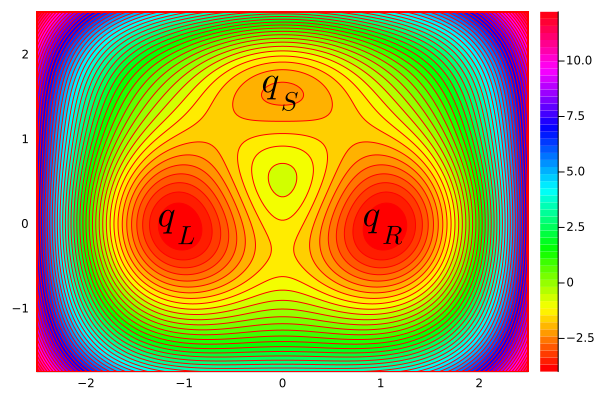

In [2]:
# First time compiling Plots takes a bit of time
using Plots, LaTeXStrings

xlims = -2.5, 2.5
ylims = -1.75, 2.5
xrange = range(xlims..., 200)
yrange = range(ylims..., 200)
qₗ = (-1.048, -0.04210, Plots.text(L"$q_{\rm L}$", pointsize=25))
qᵣ = (1.048, -0.04210, Plots.text(L"$q_{\rm R}$", pointsize=25))
qₛ = (0., 1.5371, Plots.text(L"$q_{\rm S}$", pointsize=25))
pl_V = contourf(xrange, yrange, entropic_switch, levels=50, cmap=:hsv)
annotate!(qₗ)
annotate!(qᵣ)
annotate!(qₛ)

<a id='baoab'></a>
We now define the BAOAB integrator.

<i>Julia particularities</i>
* The ```!``` at the end of the function name is to indicate that this function modifies the input.
* Had we only specified ```p⁰ -= Δt * ∇V⁰ / 2```, only the reference of the vector would have beed copied, not the content.
* Ensure to pass Float vectors, otherwise the computations won't work. It is made mandatory here, as the force function ($-\nabla V$) will return float values anyway.

In [3]:
"""
    BAOAB!(q⁰::Vector{<:Real}, p⁰::Vector{<:Real}, Δt::, β::, γ::, ∇V::Function, ∇V⁰::Vector{<:Real}, G¹::Vector{<:Real})

BAOAB integrator for the Langevin dynamics. (q⁰,p⁰) is the initial configuration, Δt the time step, β the inverse temperature, γ the friction parameter, ∇V the negative force field, ∇V⁰ the gradient of V evaluated at (q⁰,p⁰), G¹ is drawn from the standard Gaussian distribution. The Ornstein-Uhlenbeck process is integrated using the analytical expression of the solution.

The updated configuration (q¹,p¹) is stored in place of (q⁰,p⁰), as well as the gradient of the updated position.
"""
function BAOAB!(q⁰::Vector{<:Real}, p⁰::Vector{<:Real}, Δt, β, γ, ∇V::Function, ∇V⁰::Vector{<:Real}, G¹::Vector{<:Real})
    p⁰[:] -= Δt * ∇V⁰ / 2
    q⁰[:] += Δt * p⁰ / 2
    p⁰[:] = exp(-γ*Δt)*p⁰ + sqrt((1-exp(-2*γ*Δt))/β)*G¹
    q⁰[:] += Δt * p⁰ / 2
    ∇V⁰[:] = ∇V(q⁰)
    p⁰[:] -= Δt * ∇V⁰ / 2
end
;

We define a basic function to simulate the Langevin dynamics over a period of time.

In [4]:
"""
    simulate!(q⁰::Vector{<:Real}, p⁰::Vector{<:Real}, Δt, T, β, γ, ∇V::Function)

Simulate the Langevin process, starting from the initial configuration (q⁰,p⁰), using a time step Δt and a total simulation time T. The system is characterized by the inverse temperature β and the friction parameter γ, the negative force field is given by ∇V.

Outputs the trajectory (positions, momenta). positions and momenta are both matrices, each line corresponding to a state, and each column to a coordinate.
"""
function simulate!(q⁰::Vector{<:Real}, p⁰::Vector{<:Real}, Δt, T, β, γ, ∇V::Function)

    # Get the number of iterations
    Nit = round(Int, T/Δt)

    # Holds the positions over time
    positions = Array{Float64,2}(undef, Nit, 2)
    positions[1,:] = q⁰

    # Holds the momenta over time
    momenta = Array{Float64,2}(undef, Nit, 2)
    momenta[1,:] = p⁰

    # Compute first gradient
    ∇V⁰ = ∇V(q⁰)

    # Get the noise needed for all the trajectory
    noise = randn(Nit-1, 2)

    for i in 2:Nit
        
        #Simple logger to standard cout
        if i % 100000 == 0
            println("Iteration $(i)/$(Nit)")
        end

        # Integrate one step
        G = noise[i-1, :]
        BAOAB!(q⁰,p⁰,Δt,β,γ,∇V,∇V⁰,G)

        # Update the trajectory
        positions[i,:] = q⁰
        momenta[i,:] = p⁰
    end

    return positions, momenta
end

simulate!

We are now ready to get a sample trajectory.

In [5]:
T = 10000. # Simulation time
Δt = 0.1 # Time step
γ = 1. # Friction parameter
β = 1. # Inverse temperature
Nit = round(Int, T/Δt) # Number of iterations

# Initial configuration
q⁰ = [-2,-1.5]+4*rand(2)
p⁰ = randn(2)/sqrt(β)
;

In [6]:
# Get the whole trajectory
println("Computing the Langevin dynamics for $(Nit) iterations")
positions, momenta = simulate!(q⁰, p⁰, Δt, T, β,γ,∇entropic_switch)

x = positions[:,1]
y = positions[:,2]
;

Computing the Langevin dynamics for 100000 iterations


Iteration 100000/100000


We can plot the trajectory over time.

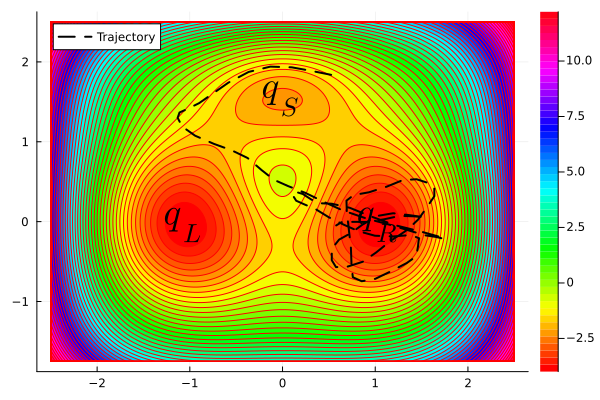

In [7]:
# Plot only beginning of the trajectory
Nmax = min(100,length(x))
plot(pl_V)
plot!(x[1:Nmax],y[1:Nmax],label="Trajectory", linestyle=:dash, color=:black, linewidth=2)

<h3>Some sanity checks</h3>

* we expect to see the conservation of the total energy of the system over time, <i>i.e.</i> the Hamiltonian, up to fluctuations;
* the momenta should be distributed following the standard Gaussian distribution (up to a factor $\beta$ in the covariance matrix).

<i>Julia particularities</i>
* ```'``` is the adjoint operator for Array structures.

In [8]:
"""
    hamiltonian(q::Vector{<:Real},p::Vector{<:Real},V::Function)

Compute the Hamiltonian of the system H(q,p)=V(q)+|p|²/2.
"""
function hamiltonian(q::Vector{<:Real},p::Vector{<:Real},V::Function)
    return V(q) + p'*p/2
end

"""
    standard_gaussian(x)

Compute the pdf of the unidimensional Gaussian distribution of mean zero and covariance β⁻¹ at x.
"""
function standard_gaussian(x)
    global β
    return exp(-β*x^2/2)*sqrt(β/(2*π))
end

"""
    standard_gaussian(x,y)

Compute the pdf of the two-dimensional Gaussian distribution of mean zero and covariance β⁻¹I₂ at (x,y).
"""
function standard_gaussian(x,y)
    global β
    return exp(-β*(x^2+y^2)/2)*β/(2*π)
end

function standard_gaussian(p::Vector{<:Real})
    return standard_gaussian(p...)
end
;

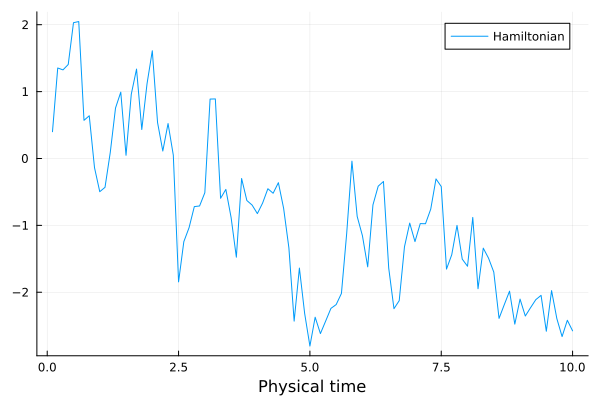

In [9]:
plot(collect(1:Nmax)*Δt, [hamiltonian(positions[i,:], momenta[i,:], entropic_switch) for i in 1:Nmax], label="Hamiltonian")
xlabel!("Physical time")

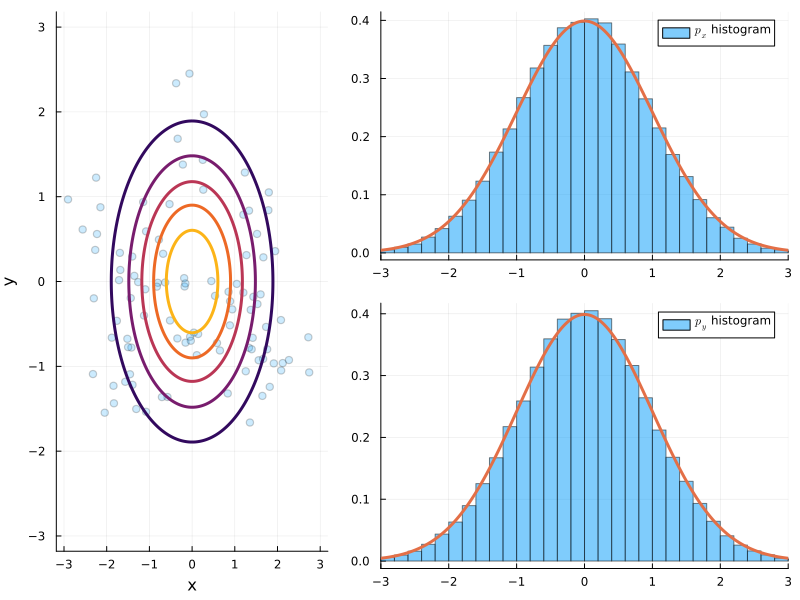

In [10]:
xlims = -3/sqrt(β), 3/sqrt(β)
ylims = -3/sqrt(β), 3/sqrt(β)
xrange = range(xlims..., 200)
yrange = range(ylims..., 200)
pl_p = scatter(momenta[1:Nmax,1],momenta[1:Nmax,2],label="",alpha=0.2)
contour!(xrange, yrange, standard_gaussian, colorbar=false, levels=5,linewidth=3)
xlabel!("x")
ylabel!("y")
hist_px = histogram(momenta[:,1],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_x$ histogram")
plot!(xrange, standard_gaussian.(xrange), label="",linewidth=3)
xlims!(xlims)
hist_py = histogram(momenta[:,2],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_y$ histogram")
plot!(yrange, standard_gaussian.(yrange), label="",linewidth=3)
xlims!(xlims)

pl = plot(
    pl_p, hist_px, hist_py, layout=@layout([°{0.4w} [°;°]]), size=(800,600)
)


<b><u>Tasks.</u> Play around with the hyperparameters ($\Delta t,T$) and the system's parameters ($\beta,\gamma$).</b>
* What happens when $\beta\uparrow$ ? When $\beta\downarrow$ ? Interpret, recalling that $\beta^{-1}=k_b T_{\rm hb}$ where $k_b$ is the Boltzmann's constant and $T_{\rm hb}$ is the temperature of the heat bath.
* What happens when $\gamma\uparrow$ ? When $\gamma\downarrow$ ? Interpret, recalling the [Langevin dynamics](#langevin) and the solution to the [Ornstein-Uhlenbeck](#ou_process) process.
* What happens when $\Delta t\uparrow$ ? When $\Delta t\downarrow$ ? Especially, look at the equilibrium distribution of the momenta when $\Delta t=0.5$.

<a id='midpoint-euler'></a>
<b><u>Tasks.</u> It is time to code a bit !</b>
* Code the ABOBA integrator, following the same structure as for the function ```BAOAB!``` (see [this cell](#baoab)).
* Even though the Ornstein-Uhlenbeck can be solved anatycally, the exact form of its solution is cumbersome to compute for more complex systems (<i>e.g.</i> for constrained processes, or when using (anisotropic) multiplicative noise). Therefore, a simple midpoint Euler scheme is often used. This scheme reads
$$
\tag{Midpoint Euler}
p^1 = p^0 - \frac{\Delta t}{2}\gamma M^{-1}(p^0+p^1)+\sqrt{\frac{2\gamma\Delta t}{\beta}} {\rm G}^1,\qquad {\rm G}^1\sim\mathcal{N}(0,{\rm I}_{dN}).
$$
Define the function ```BAOAB_midpoint!``` based on the BAOAB integrator which uses this update instead of the analytical one. You may want to use the ```\``` operator.
* A variant of the OBABO integrator is the Brünger-Brooks-Karplus (BBK) integrator, which is given by
$$
\tag{BBK}
\left\lbrace
\begin{aligned}
p^{1/2} &= p^0 -\frac{\Delta t}{2}\nabla V(q^0)-\frac{\Delta t}{2}\gamma M^{-1}p^0+\sqrt{\frac{\gamma \Delta t}{\beta}}{\rm G}^{1/2},\\
q^{1} &= q^0 + \Delta t M^{-1} p^{1/2},\\
p^{1} &= p^{1/2}-\frac{\Delta t}{2}\nabla V(q^{1})-\frac{\Delta t}{2}\gamma M^{-1}p^1+\sqrt{\frac{\gamma\Delta t}{\beta}}{\rm G}^1,
\end{aligned}
\right.
$$
where $({\rm G}^{1/2},{\rm G}^1)$ is a pair of i.i.d. Gaussian random vectors with zero mean and covariance matrix ${\rm I}_{dN}$. Define the function ```BBK!``` based on this scheme.

<h2>Metropolization of the Langevin dynamics</h2>

As hinted above, the numerical approximation of the Langevin diffusion process does not sample <i>exactly</i> the Boltzmann-Gibbs distribution $\mu$: there exists a bias, which comes from the discretization using a positive time step $\Delta t$. This bias increases as $\Delta t$ gets larger. In order to resolve this issue, we introduce a generalized Metropolis procedure which ensures that the sampled distribution is $\mu$.

The method is straightforward: a move is generated according to some given proposition kernel $T((q,p),{\rm d}q\,{\rm d}p)$ (<i>e.g.</i> defined by a discretization of the Langevin dynamics), and then either accepted or rejected according to a rule such that the probability distribution $\mu$ is an invariant measure of the corresponding Markov chain. The rule relies on an <i>acceptance function</i> $h:(0,\infty)\to(0,1]$ such that $h(r)=rh(1/r)$ for all $r>0$.

In the case of Langevin dynamics, the proposition kernel $T$ is reversible with respect to $\mu$ <b>up to momenta reversal</b>: defining $S(q,p)=(q,-p)$ the momenta reversal map, the two following properties are satisfied:
* $S$ is a smooth involutive transformation: $S^{-1}=S$;
* $S$ leaves the Boltzmann-Gibbs distribution invariant: $\mu(S^{-1}({\rm d}q\,{\rm d}p))=\mu(S({\rm d}q\,{\rm d}p))=\mu({\rm d}q\,{\rm d}p)$. This comes from the fact that the kinetic energy is quadratic in $p$.

Define the Metropolis ratio
$$
r((q,p),(q',p'))=\frac{T(S(q',p'),S({\rm d}q\,{\rm d}p))}{T((q,p),{\rm d}q'\,{\rm d}p')}\frac{\mu({\rm d}q'\,{\rm d}p')}{\mu({\rm d}q\,{\rm d}p)}.
$$
If $(q^0,p^0)$ denotes the state of the Markov chain, then a new state $(\tilde{q}^1,\tilde{p}^1)$ is proposed according to the proposition kernel $T((q⁰,p^0),\cdot)$, and then accepted with probability $h(r(q^0,p^0),(\tilde{q}^1,\tilde{p}^1))$, i.e. the new state of the Markov chain
is 
$$
(q^1,p^1)=\left\lbrace
\begin{aligned}
 & (\tilde{q}^1,\tilde{p}^1) &\text{if }{\rm U}^1\leqslant h(r(q^0,p^0),(\tilde{q}^1,\tilde{p}^1)),\\
 & (q^0,p^0) &\text{otherwise},
\end{aligned}
\right.
$$
with ${\rm U}^1\sim\mathcal{U}([0,1])$ a random variable sampled from the uniform distribution on $[0,1]$. Note that the transition kernel $T(S(q',p'),S({\rm d}q\,{\rm d}p))$ corresponds to the following Markov chain: from the configuration $(q',p')$, reverse the sign of its momenta by considering $S(q',p')=(q',-p')$, obtain a new configuration $(q,p)$ using the transition kernel $T(S(q,p),{\rm d}q\,{\rm d}p)$ and reverse the sign of its momenta thus considering $S(q,p)=(q,-p)$.

<h3>Generalized Hybrid Monte-Carlo</h3>

A common choice for the acceptance function $h$ is the Hastings rule: $h(r)=\min(1,r)$. The Generalized Hybrid Monte-Carlo (GHMC) algorithm is then obtained thanks to a splitting technique, considering separately the Hamiltonian and fluctuation-dissipation parts of the Langevin dynamics. The Metropolis-Hastings aims to correct the proposal after integrating the Hamiltonian's dynamics. The algorithm reads:
$$
\tag{GHMC}
\left\lbrace
\begin{aligned}
    (q^0,p^{1/4})&=\varphi_{\Delta t/2}^{\rm O}(q^0,p^0),\\
    (\tilde{q}^1,\tilde{p}^{3/4})&=\varphi_{\Delta t}^{\rm SV}(q^0,p^{1/4}),\\
    (q^1,p^{3/4})&=
    \left\lbrace
    \begin{aligned}
        &(\tilde{q}^1,\tilde{p}^{3/4}) &\text{if }{\rm U}^1\leqslant \exp\left[-\beta\left(H\left(\tilde{q}^1,\tilde{p}^{3/4}\right)-H\left(q^0,p^{1/4}\right)\right)\right],\\
        &(q^0,-p^{1/4}) & \text{otherwise},
    \end{aligned}
    \right.\\
    (q^1,p^1)&=\varphi_{\Delta t/2}^{\rm O}(q^1,p^{3/4}),
\end{aligned}
\right.
$$
where $\varphi_{\Delta t}^{\rm SV}$ denotes the Störmer-Verlet inregrator defined at [the beginning of this notebook](#langevin), and $\varphi_{\Delta t/2}^{\rm O}$ corresponds to the integration of the Ornstein-Uhlenbeck process either using an exact formula (see also [the beginning of this notebook](#langevin)) or resorting to the midpoint Euler scheme (see [this cell](#midpoint-euler)).

<i>Remark:</i> It it necessary to change the sign of the momenta upon rejection during the Metropolis-Hastings procedure. This means that the dynamics properties of the trajectory are lost as soon as rejection occurs. However, this is the only way to ensure unbiased sampling of the Boltzmann-Gibbs distribution.

<u><b>Question.</u> In view of the form of the Metropolis-Hastings ratio, when does a proposal is always accepted ?</b>

<h3>Numerical implementation</h3>

We implement one step of the GHMC scheme, using the analytical expression of the solution of the Ornstein-Uhlenbeck process. We can then create a Markov chain using this algorithm over a given number of iterations.

In [11]:
"""
    GHMC_one_step!(q⁰::Vector{<:Real},p⁰::Vector{<:Real},Δt,β,γ,V::Function, ∇V::Function,∇V⁰::Vector{<:Real},Gᵃ::Vector{<:Real},Gᵇ::Vector{<:Real},U¹)

Performs one step of the Generalized Hamiltonian Monte Carlo algorithm starting from the configuration (q⁰,p⁰) using a time step Δt, an inverse temperature β, a friction parameter γ. V denotes the potential energy function, ∇V the negative force field. ∇V⁰ is the gradient of V evaluated at (q⁰,p⁰), Gᵃ and Gᵇ are drawn from the standard Gaussian distribution, U¹ is drawn from the uniform distribution on [0,1]. The Ornstein-Uhlenbeck process is integrated using the analytical expression of the solution.

The updated configuration (q¹,p¹) is stored in place of (q⁰,p⁰), as well as the gradient of the updated position. Outputs true if the proposal is accepted, false otherwise.
"""
function GHMC_one_step!(q⁰::Vector{<:Real},p⁰::Vector{<:Real},Δt,β,γ,V::Function, ∇V::Function,∇V⁰::Vector{<:Real},Gᵃ::Vector{<:Real},Gᵇ::Vector{<:Real},U¹)

    # Check if rejection or acceptance
    accept = false

    # Half-step of the OU process
    p⁰[:] = exp(-γ*Δt/2)*p⁰ + sqrt((1-exp(-γ*Δt))/β)*Gᵃ

    # Initialize the proposal
    q̃⁰ = copy(q⁰)
    p̃⁰ = copy(p⁰)

    # Integrate the Hamiltonian dynamics
    p̃⁰[:] -= Δt * ∇V⁰/2
    q̃⁰[:] += Δt * p̃⁰
    ∇V¹ = ∇V(q̃⁰)
    p̃⁰[:] -= Δt * ∇V¹/2

    # Metropolis-Hastings procedure
    # Numerical hint: we compare the logarithms for numerical stability
    H⁰ = hamiltonian(q⁰,p⁰,V)
    H̃⁰ = hamiltonian(q̃⁰,p̃⁰,V)

    if log(U¹) <= -β * (H̃⁰-H⁰)
        p⁰[:] = p̃⁰
        q⁰[:] = q̃⁰
        ∇V⁰[:] = ∇V¹
        accept = true
    else
        p⁰[:] = - p⁰
    end

    # Half-step of the OU process
    p⁰[:] = exp(-γ*Δt/2)*p⁰ + sqrt((1-exp(-γ*Δt))/β)*Gᵇ

    return accept
end
;

In [12]:
"""
    GHMC!(q⁰::Vector{<:Real},p⁰::Vector{<:Real}, Δt, Nit::Int,β,γ,V::Function, ∇V::Function)

Generate a Markov chain trajectory using the Generalized Hamiltonian Monte Carlo algorithm, starting from the initial configuration (q⁰,p⁰) using a time step Δt, a number of iteration Nit, an inverse temperature β, a friction parameter γ. V denotes the potential energy function, ∇V the negative force field.

Outputs (positions, momenta, acceptance_probability), where (positions, momenta) correspond to the trajectory and are both matrices, each line corresponding to a state, and each column to a coordinate, while acceptance_probability is the averaged acceptance probability over the trajectory corresponding to the Metropolis-Hastings procedure.
"""
function GHMC!(q⁰::Vector{<:Real},p⁰::Vector{<:Real}, Δt, Nit::Int,β,γ,V::Function, ∇V::Function)

    # Holds the positions over time
    positions = Array{Float64,2}(undef, Nit, 2)
    positions[1,:] = q⁰

    # Holds the momenta over time
    momenta = Array{Float64,2}(undef, Nit, 2)
    momenta[1,:] = p⁰

    # Compute first gradient
    ∇V⁰ = ∇V(q⁰)

    # Get the noise needed for all the trajectory
    noiseᵃ = randn(Nit-1, 2)
    noiseᵇ = randn(Nit-1, 2)

    # Get the r.v. for the acceptance probability test for all the trajectory
    uniform = rand(Nit-1)

    # Holds the acceptance probability
    acceptance_probability = 0

    for i in 2:Nit
        #Simple logger to standard cout
        if i % 100000 == 0
            println("Iteration $(i)/$(Nit)")
        end

        # Integrate one step
        Gᵃ = noiseᵃ[i-1, :]
        Gᵇ = noiseᵇ[i-1, :]
        U¹ = uniform[i-1]

        if GHMC_one_step!(q⁰,p⁰,Δt,β,γ,V,∇V,∇V⁰,Gᵃ,Gᵇ,U¹)
            acceptance_probability += 1
        end

        # Update the trajectory
        positions[i,:] = q⁰
        momenta[i,:] = p⁰
    end

    acceptance_probability /= (Nit-1)

    return positions, momenta, acceptance_probability
end
;

We first compute a sample trajectory.

In [13]:
Δt = 0.5
γ = 1.
β = 1.
Nit = 1_000_000

# Initial configuration
# Initial configuration
q⁰ = [-2,-1.5]+4*rand(2)
p⁰ = randn(2)/sqrt(β)
;

In [14]:
# Get the whole trajectory
println("Computing the Langevin dynamics for $(Nit) iterations")
positions, momenta, acceptance_probability = GHMC!(q⁰, p⁰, Δt, Nit, β,γ, entropic_switch,∇entropic_switch)

println("The average acceptance probability over one time step is $(round(acceptance_probability*100,sigdigits=4))%")

x = positions[:,1]
y = positions[:,2]
;

Computing the Langevin dynamics for 1000000 iterations


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
The average acceptance probability over one time step is 66.83%


We plot the trajectory over time.

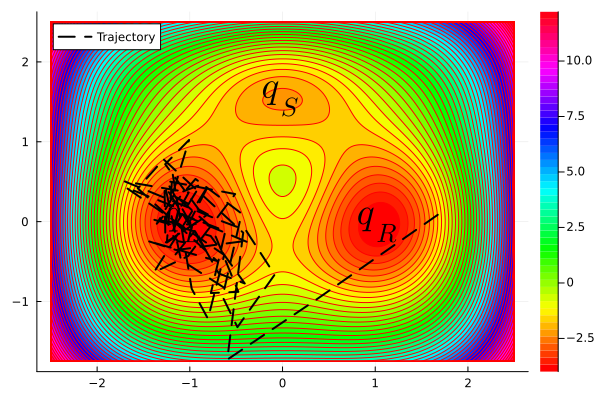

In [15]:
# Plot only beginning of the trajectory
Nmax = min(100,length(x))
plot(pl_V)
plot!(x[1:Nmax],y[1:Nmax],label="Trajectory", linestyle=:dash, color=:black, linewidth=2)

<h3>Some sanity checks</h3>

* again, we expect to see the conservation of the Hamiltonian over time up to fluctuations;
* the momenta should be normally distributed (up to a factor $\beta$ in the covariance matrix) <b>whatever the time step $\Delta t>0$</b>;
* since we are in dimension $d=2$, we can visualize if the sampling is (somewhat) consistent by comparing the histogram of the positions and the Gibbs distribution $\pi$, the marginal in position of the Boltzmann-Gibbs distribution, that is
$$
\pi({\rm d}q)=Z_{\pi}^{-1}{\rm e}^{-\beta V(q)}{\rm d}q,\qquad Z_{\pi}=\int_{\mathbb{R}^{dN}}{\rm e}^{-\beta V(q)}{\rm d}q;
$$
* the rejection probability over one time step scales as ${\rm O}(\Delta t^3)$ when $\Delta t\to 0$. This comes from the fact that the Störmer-Verlet integrator is a second order consistent discretization of the Hamiltonian dynamics.

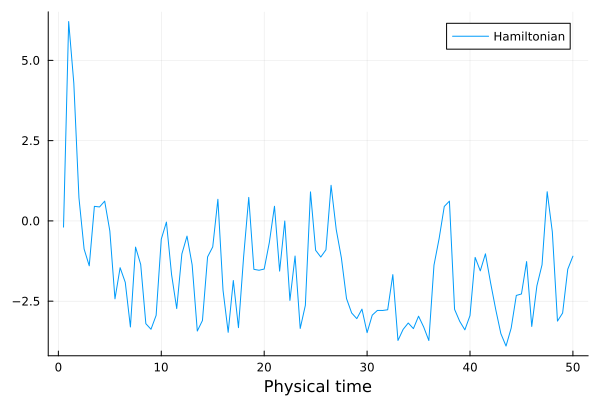

In [16]:
plot(collect(1:Nmax)*Δt, [hamiltonian(positions[i,:], momenta[i,:], entropic_switch) for i in 1:Nmax], label="Hamiltonian")
xlabel!("Physical time")

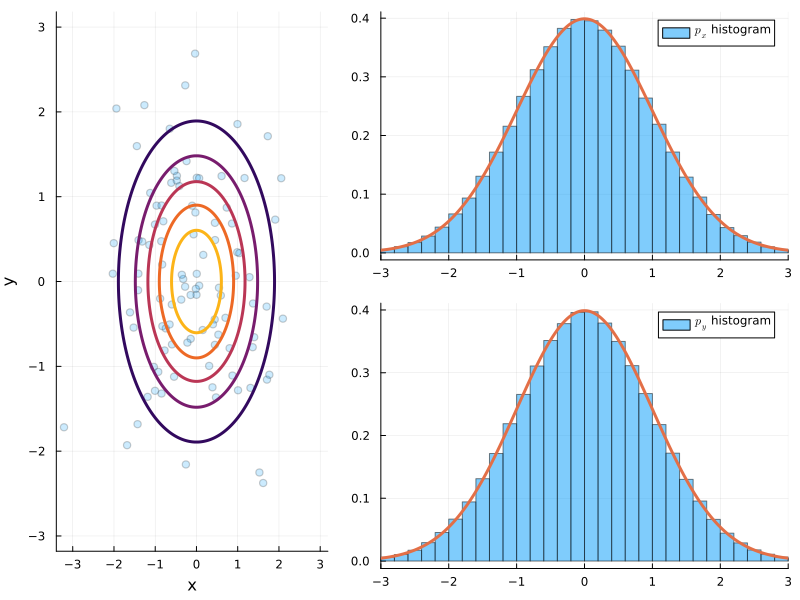

In [17]:
xlims = -3/sqrt(β), 3/sqrt(β)
ylims = -3/sqrt(β), 3/sqrt(β)
xrange = range(xlims..., 200)
yrange = range(ylims..., 200)
pl_p = scatter(momenta[1:Nmax,1],momenta[1:Nmax,2],label="",alpha=0.2)
contour!(xrange, yrange, standard_gaussian, colorbar=false, levels=5,linewidth=3)
xlabel!("x")
ylabel!("y")
hist_px = histogram(momenta[:,1],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_x$ histogram")
plot!(xrange, standard_gaussian.(xrange), label="",linewidth=3)
xlims!(xlims)
hist_py = histogram(momenta[:,2],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_y$ histogram")
plot!(yrange, standard_gaussian.(yrange), label="",linewidth=3)
xlims!(xlims)

pl = plot(
    pl_p, hist_px, hist_py, layout=@layout([°{0.4w} [°;°]]), size=(800,600)
)


In [18]:
using Cubature

"""
    mu_marg(x,y)

Compute the un-normalized Gibbs distribution.
"""
function mu_marg(x,y)
    return exp(-β*entropic_switch(x,y))
end

function mu_marg(q::Vector{<:Real})
    return mu_marg(q...)
end

# Using a quadrature method
Zμ, err = hcubature(mu_marg, (-10,-10),(10,10))
println("Value of ∫dπ using quadrature method is $(Zμ) ± $(err)")

"""
    μ_marg(x,y)

Compute the normalized Gibbs distribution.
"""
function μ_marg(x,y)
    return mu_marg(x,y)/Zμ
end

function μ_marg(q::Vector{<:Real})
    return μ_marg(q...)
end
;

Value of ∫dπ using quadrature method is 93.82137926136828 ± 9.378989332150297e-7


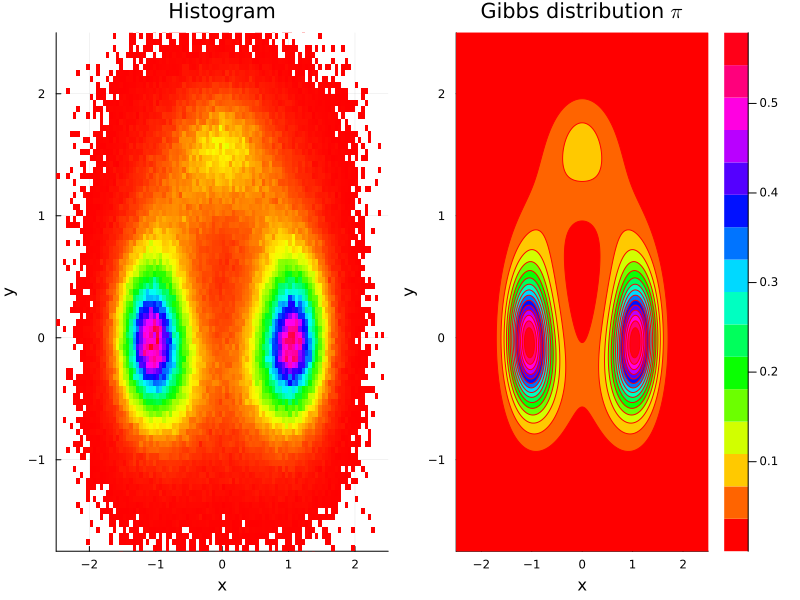

In [19]:
# Visualize the sampling, note that the histogram is not normalized to a pdf.

xlims = -2.5, 2.5
ylims = -1.75, 2.5
xrange = range(xlims..., 500)
yrange = range(ylims..., 500)
hist = histogram2d(positions[:,1],positions[:,2],cmap=:hsv,bins=100,title="Histogram", colorbar=false)
xlims!(xlims)
ylims!(ylims)
xlabel!("x")
ylabel!("y")
pl_μ = contourf(xrange, yrange, μ_marg, cmap=:hsv, title=L"Gibbs distribution $\pi$")
xlabel!("x")
ylabel!("y")
plot(hist, pl_μ, layout=@layout([° °]),size=(800,600))

In [20]:
Δt_range = 10 .^range(-3,log(4)/log(10), 10)
rejection_probabilities_averaged = Vector{Float64}(undef, length(Δt_range))

for (idx_Δt, Δt) in enumerate(Δt_range) 
    println("Running for Δt=$(round(Δt, sigdigits=2))")
    # Fix initial conditions
    q⁰ = [0.,0.]
    p⁰ = [1.,1.]/sqrt(β)
    positions, momenta, acceptance_probability = GHMC!(q⁰, p⁰, Δt, Nit, β,γ, entropic_switch,∇entropic_switch)
    rejection_probabilities_averaged[idx_Δt] = 1-acceptance_probability
end

Running for Δt=0.001


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.0025


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.0063


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.016


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.04


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.1


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.25


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=0.63


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=1.6


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000
Running for Δt=4.0


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000


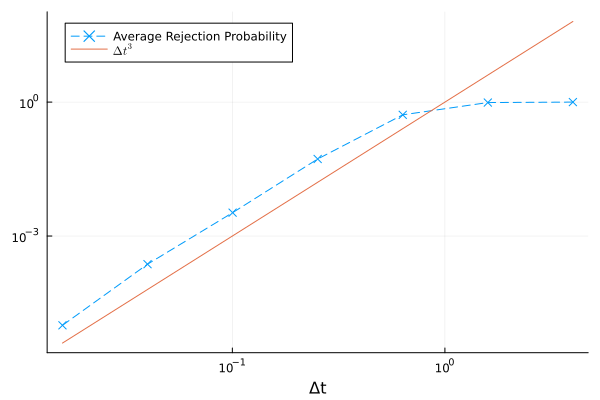

In [21]:
mask = rejection_probabilities_averaged .> 0
plot(Δt_range[mask], rejection_probabilities_averaged[mask], xaxis=:log, yaxis=:log, label="Average Rejection Probability", linestyle=:dash, markers=:x)
plot!(Δt_range[mask], Δt_range[mask] .^3, label=L"$Δt^3$", legend=:topleft)
xlabel!("Δt")

<h3>Using ergodic theorems, statistical efficiency</h3>

Since we perform an unbiased sampling of $\mu$, an unbiased estimator of $\int_{\mathbb{R}^{dN}\times\mathbb{R}^{dN}} f{\rm d}\mu$ for an observable an observable $f:(q,p)\mapsto f(q,p)$ is 
$$
\frac{1}{\rm N_{it}}\sum_{i=1}^{\rm N_{it}}f(q^i,p^i).
$$
In particular, if the observable $f:q\mapsto f(q)$ only depends on the position $q$, then an unbiased estimator of $\int_{\mathbb{R}^{dN}}f{\rm d}\pi$ is
$$
\frac{1}{\rm N_{it}}\sum_{i=1}^{\rm N_{it}}f(q^i).
$$

In [22]:
# Set parameters
Δt = 0.5
Nit = 1_000_000
β=1.
γ=1.
q⁰ = [0.,0.]
p⁰ = [1.,1.]/sqrt(β)

# Run MCMC
positions, momenta, acceptance_probability = GHMC!(q⁰, p⁰, Δt, Nit, β,γ, entropic_switch,∇entropic_switch)
;

Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000


In [23]:
# Unbiased estimation of an observable f which only depends on the position

function f(x,y)
    return x^2 + y^2
end

function f(q::Vector{<:Real})
    return f(q...)
end

# Compute the value of ∫f dπ where π is the Gibbs distribution (marginal probability distribution of μ w.r.t. the position)
Zf, err = hcubature(q->f(q)*μ_marg(q), (-10,-10),(10,10))

f_MCMC = f.([positions[i,:] for i in 1:Nit])
MCMC_estimate = sum(f_MCMC) / Nit

println("∫fdπ value using quadrature method is $(Zf) ± $(err)")
println("∫fdπ value using MCMC estimate is $(MCMC_estimate)")

∫fdπ value using quadrature method is 1.4165305889108997 ± 1.4151117509354574e-8
∫fdπ value using MCMC estimate is 1.4154766364665352


Obtaining a confidence interval for the MCMC estimate is a bit involved: the CLT usually holds but the asymptotic variance depends on the observable and the transition kernel (it requires to solve a Poisson equation).

One can however compute the effective sample size of the Markov chain and use it to extract (approximate) i.i.d samples of the chain. A CLT-like formula can then be estimated to obtain a confidence interval.

Just to take a brief look at the behavior of the Markov chain, we compute the autocorrelation function (ACF) and estimate an effective sample size (ESS) for each coordinate of the position (we therefore cannot observe the cross-correlation across the two components). We also compute those quantities for the observable $f$. 

If the observable $f:\mathbb{R}^{dN}\times\mathbb{R}^{dN}\to\mathbb{R}^p$ is vector-valued, one can resort to computing the minimum of the ESS on each coordinate, or better yet, use the ESS formula defined in Vats <i>et al.</i> (2019) (see [here](https://github.com/rsantet/multiESS) for a basic Julia implementation).

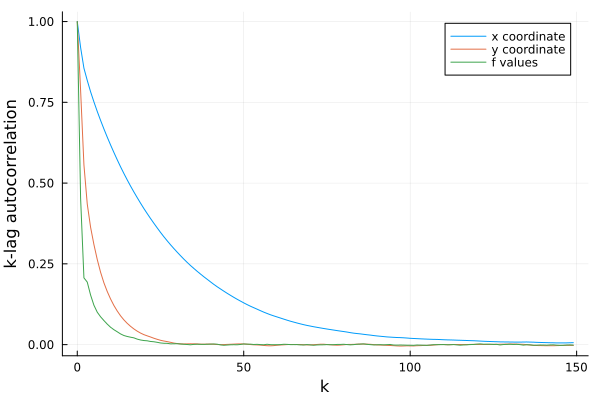

In [24]:
using StatsBase

n_lags = 150
lags = collect(0:n_lags-1) # Usually a maximum value between 50 and 100 is enough, but more is needed here to see the convergence towards 0 for the x coordinate
get_lags = autocor(positions, lags)
get_lags_f = autocor(f_MCMC, lags)

plot(lags, get_lags[:,1], label="x coordinate")
plot!(lags, get_lags[:,2], label="y coordinate")
plot!(lags, get_lags_f, label="f values")
xlabel!("k")
ylabel!("k-lag autocorrelation")

In [25]:
# Compute effective sample size, assuming that we have univariate time series for each coordinates

ESS_x = Nit/(1+2*sum(get_lags[:,1]))
ESS_y = Nit/(1+2*sum(get_lags[:,2]))

# Compute the ESS for the observable f
ESS_f = Nit/(1+2*sum(get_lags_f))

println("Effective sample size for the x position is $(round(Int, ESS_x))")
println("Effective sample size for the y position is $(round(Int, ESS_y))")
# Note that using a multivariate ESS on (x,y), I obtain about 46700 for the global ESS for Δt = 0.5.
println("Effective sample size for f is $(round(Int, ESS_f))")

Effective sample size for the x position is 20317
Effective sample size for the y position is 87738
Effective sample size for f is 151019


<b><u>Question.</u> Why does the ESS for the x coordinate is less than the ESS for the y coordinate ?</b>

<b><u>Question.</u> What is a reasonable rule to know the number of values $k$ (the lags) we should take into account in practice in the computation of the ESS ?</b>

In [26]:
# Compute one standard error for the MCMC estimate
MCMC_std_error = sqrt(var(f_MCMC)/ESS_f)

println("∫fdπ value using quadrature method is $(Zf) ± $(err)")
println("∫fdπ value using MCMC estimate is $(MCMC_estimate) ± $(MCMC_std_error)")

∫fdπ value using quadrature method is 1.4165305889108997 ± 1.4151117509354574e-8
∫fdπ value using MCMC estimate is 1.4154766364665352 ± 0.002245317419570851


<b><u>Tasks.</u> It is time to code a bit !</b>

* Define another observable $f:q\mapsto f(q)$ of your choice and use the precomputed MCMC trajectory to estimate its mean with respect to the Gibbs distribution.
* Observe the accuracy of the MCMC estimator with the number of iterations. To do this, either call the ```GHMC!``` function with various number of iterations, or better yet, code your own function ```GHMC_estimate_f!``` that takes as input the observable $f$ and tracks the value of the MCMC estimator all along the trajectory.
* Estimate the mean duration time between the two metastable states $q_{\rm L}$ and $q_{\rm R}$. To do this, define for $D\geqslant0$ the two sets
$$
\mathcal{C}_{\rm L} = \left\lbrace q\in \mathbb{R}^{2}\,\middle|\, \left\lVert q-q_{\rm L}\right\rVert_{2}\leqslant D\right\rbrace,\qquad
\mathcal{C}_{\rm R} = \left\lbrace q\in \mathbb{R}^{2}\,\middle|\, \left\lVert q-q_{\rm R}\right\rVert_{2}\leqslant D\right\rbrace.
$$
Starting from an initial position $q^0\in\mathcal{C}_{\rm L}$, compute the physical time it takes for the particle to reach $\mathcal{C}_{\rm R}$, and then compute an average. The time step should be taken large at first (around $0.1$) to check if your algorithm works. The "real" physical time is then obtained when $\Delta t\to0$ (compute for various $\Delta t\leqslant 10^{-3}$ and observe the convergence towards a limiting value).
* Instead of the Hastings rule $h(r)=\min(1,r)$, use the Barker's rule
$$
h(r) = \frac{r}{r+1},
$$
or even the generalized rule
$$
h_p(r)=\frac{r}{r+1}\left(1+2\left[\frac{1}{2}\min\left(r,\frac{1}{r}\right)\right]^p\right).
$$